<p align="center">
    <strong style="font-size: 25px;">An Anime Generator project with "GAN" using "TensorFlow"</strong>
</p>

<br>

<p align="center">
    <span style="font-size: 16.5px; font-weight: normal;">Mohammad Soroush Esnaashari</span>
</p>

<p align="center">
  <a href="https://soroushesnaashari.github.io" target="_blank" style="display:inline-block; margin:0 4px;">
    <img alt="Website"
         src="https://img.shields.io/badge/-Website-2d2d2d?style=flat-square&logo=githubpages&logoColor=white"
         style="vertical-align:middle;">
  </a>
  <a href="https://www.linkedin.com/in/soroushesnaashari" target="_blank" style="display:inline-block; margin:0 4px;">
    <img alt="LinkedIn"
         src="https://custom-icon-badges.demolab.com/badge/-LinkedIn-2d2d2d?style=flat-square&logo=linkedin-white&logoColor=white"
         style="vertical-align:middle;">
  </a>
  <a href="https://x.com/srshesn" target="_blank" style="display:inline-block; margin:0 4px;">
    <img alt="X"
         src="https://img.shields.io/badge/-Twitter-2d2d2d?style=flat-square&logo=X&logoColor=white"
         style="vertical-align:middle;">
  </a>
  <a href="https://github.com/soroushesnaashari" target="_blank" style="display:inline-block; margin:0 4px;">
    <img alt="GitHub"
         src="https://img.shields.io/badge/-GitHub-2d2d2d?style=flat-square&logo=github&logoColor=white"
         style="vertical-align:middle;">
  </a>
  <a href="https://www.kaggle.com/soroushesnaashari" target="_blank" style="display:inline-block; margin:0 4px;">
    <img alt="Kaggle"
         src="https://img.shields.io/badge/-Kaggle-2d2d2d?style=flat-square&logo=kaggle&logoColor=white"
         style="vertical-align:middle;">
  </a>
</p>

## <span style="color: #c77dff">1 | </span><span style="color: #7b2cbf">Libraries</span>

In [1]:
import os
import time
import random
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow.keras import layers
from IPython.display import Image, display

2025-04-28 13:04:57.371006: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1745845497.784651      19 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1745845497.904211      19 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


## <span style="color: #c77dff">2 | </span><span style="color: #7b2cbf">PreProcessing</span>

### <span style="color: #e0aaff">2.1 | </span><span style="color: #9d4edd">Constants</span>

In [2]:
DATA_DIR      = "/kaggle/input/animefacedataset/images"
IMAGE_SIZE    = 64
BATCH_SIZE    = 256
BUFFER_SIZE   = 60000
AUTOTUNE      = tf.data.AUTOTUNE

In [3]:
file_pattern = os.path.join(DATA_DIR, '*.jpg')
list_ds      = tf.data.Dataset.list_files(file_pattern, shuffle=True, seed=42)

I0000 00:00:1745845516.824458      19 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13942 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1745845516.825287      19 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13942 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


### <span style="color: #e0aaff">2.2 | </span><span style="color: #9d4edd">Inspect and plot original image sizes</span>

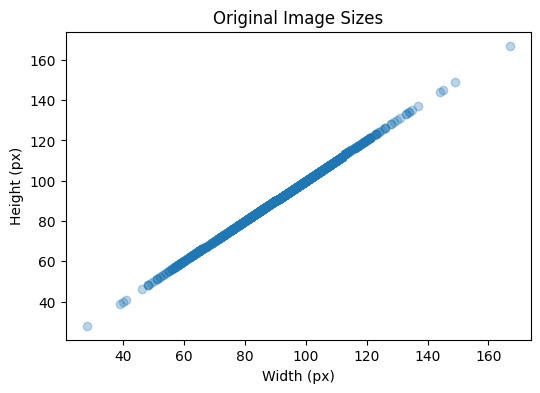

In [4]:
def get_original_size(path):
    img = tf.io.decode_jpeg(tf.io.read_file(path), channels=3)
    shape = tf.shape(img)[:2]
    return shape

sizes = [tuple(sz.numpy()) for sz in list_ds.map(get_original_size).batch(1000).take(1)][0]
heights, widths = zip(*sizes)


# Plot original size distribution
plt.figure(figsize=(6,4))
plt.scatter(widths, heights, alpha=0.3)
plt.title("Original Image Sizes")
plt.xlabel("Width (px)")
plt.ylabel("Height (px)")
plt.show()

### <span style="color: #e0aaff">2.3 | </span><span style="color: #9d4edd">Preprocessing function (decode, resize, normalize)</span>

In [5]:
def load_and_preprocess(path):
    image = tf.io.decode_jpeg(tf.io.read_file(path), channels=3)
    image = tf.image.resize(image, [IMAGE_SIZE, IMAGE_SIZE])
    image = (image - 127.5) / 127.5
    return image

### <span style="color: #e0aaff">2.4 | </span><span style="color: #9d4edd">Build tf.data pipeline</span>

In [6]:
train_dataset = (
    list_ds
    .map(load_and_preprocess, num_parallel_calls=AUTOTUNE)
    .shuffle(BUFFER_SIZE)
    .batch(BATCH_SIZE, drop_remainder=True)
    .prefetch(AUTOTUNE)
)

### <span style="color: #e0aaff">2.5 | </span><span style="color: #9d4edd">Verify resized sizes and plot</span>

All images resized to: 64×64


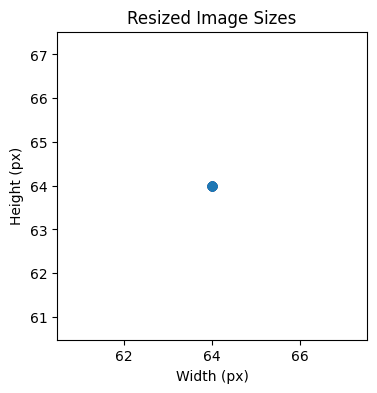

In [7]:
batch = next(iter(train_dataset))
resized_heights = batch.shape[1]
resized_widths  = batch.shape[2]
print(f"All images resized to: {resized_heights}×{resized_widths}")


# Plot a scatter to illustrate uniformity
plt.figure(figsize=(4,4))
plt.scatter([resized_widths]*100, [resized_heights]*100, alpha=0.3)
plt.title("Resized Image Sizes")
plt.xlabel("Width (px)")
plt.ylabel("Height (px)")
plt.show()

### <span style="color: #e0aaff">2.6 | </span><span style="color: #9d4edd">Display 8 random images with their sizes underneath</span>

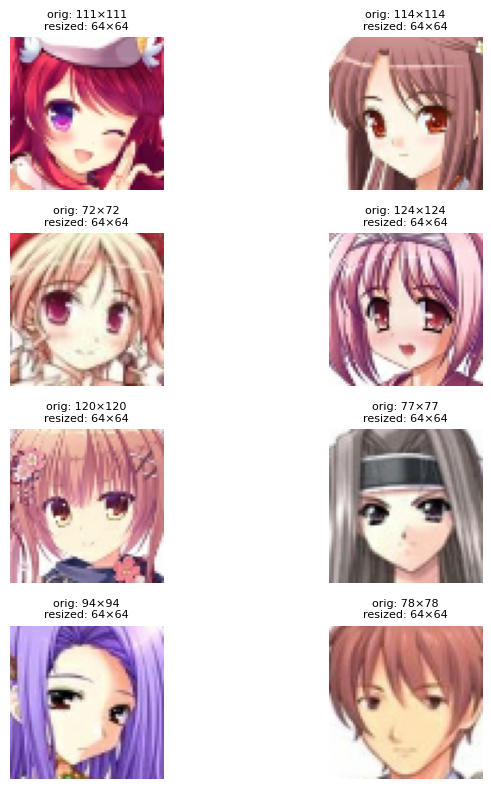

In [8]:
all_paths   = [p.decode('utf-8') for p in list_ds.as_numpy_iterator()]
sample_paths = random.sample(all_paths, 8)

plt.figure(figsize=(8,8))
for i, path in enumerate(sample_paths):
    img_orig = tf.io.decode_jpeg(tf.io.read_file(path), channels=3)
    h0, w0   = img_orig.shape[:2]

    img = load_and_preprocess(path)
    img = (img + 1.0) / 2.0

    plt.subplot(4,2,i+1)
    plt.imshow(img.numpy())
    plt.axis('off')
    plt.title(f"orig: {w0}×{h0}\nresized: {IMAGE_SIZE}×{IMAGE_SIZE}", fontsize=8)

plt.tight_layout()
plt.show()

## <span style="color: #c77dff">3 | </span><span style="color: #7b2cbf">Creating a **DCGAN** Model</span>

### <span style="color: #e0aaff">3.1 | </span><span style="color: #9d4edd">Generator</span>

In [9]:
def make_generator_model(latent_dim=100):
    model = tf.keras.Sequential(name="generator")
    model.add(layers.Dense(8*8*256, use_bias=False, input_shape=(latent_dim,)))
    model.add(layers.BatchNormalization())
    model.add(layers.ReLU())
    model.add(layers.Reshape((8, 8, 256)))

    model.add(layers.Conv2DTranspose(128, (5,5), strides=(2,2), padding="same", use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.ReLU())

    model.add(layers.Conv2DTranspose(64, (5,5), strides=(2,2), padding="same", use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.ReLU())

    model.add(layers.Conv2DTranspose(3, (5,5), strides=(2,2), padding="same", use_bias=False, activation="tanh"))

    return model

latent_dim = 100
generator = make_generator_model(latent_dim)
generator.summary()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "generator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense (Dense)                        │ (None, 16384)               │       1,638,400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 16384)               │          65,536 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ re_lu (ReLU)                         │ (None, 16384)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ reshape (Reshape)                    │ (None, 8, 8, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose (Conv2DTranspose)   │ (None, 16, 16, 128)         │         819,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 16, 16, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ re_lu_1 (ReLU)                       │ (None, 16, 16, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_1 (Conv2DTranspose) │ (None, 32, 32, 64)          │         204,800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 32, 32, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ re_lu_2 (ReLU)                       │ (None, 32, 32, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_2 (Conv2DTranspose) │ (None, 64, 64, 3)           │           4,800 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,733,504 (10.43 MB)

 Trainable params: 2,700,352 (10.30 MB)

 Non-trainable params: 33,152 (129.50 KB)

### <span style="color: #e0aaff">3.2 | </span><span style="color: #9d4edd">Discriminator</span>

In [10]:
def make_discriminator_model():
    model = tf.keras.Sequential(name="discriminator")
    model.add(layers.Conv2D(64, (5,5), strides=(2,2), padding="same", input_shape=[64,64,3]))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.Dropout(0.3))

    model.add(layers.Conv2D(128, (5,5), strides=(2,2), padding="same"))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.Dropout(0.3))

    model.add(layers.Conv2D(256, (5,5), strides=(2,2), padding="same"))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.Dropout(0.3))

    model.add(layers.Flatten())
    model.add(layers.Dense(1))

    return model

discriminator = make_discriminator_model()
discriminator.summary()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


Model: "discriminator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 32, 32, 64)          │           4,864 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu (LeakyReLU)              │ (None, 32, 32, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 32, 32, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 16, 16, 128)         │         204,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_1 (LeakyReLU)            │ (None, 16, 16, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 16, 16, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 8, 8, 256)           │         819,456 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_2 (LeakyReLU)            │ (None, 8, 8, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 8, 8, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 16384)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │          16,385 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,045,633 (3.99 MB)

 Trainable params: 1,045,633 (3.99 MB)

 Non-trainable params: 0 (0.00 B)

### <span style="color: #e0aaff">3.3 | </span><span style="color: #9d4edd">Loss Functions</span>

In [11]:
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    return real_loss + fake_loss

def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

### <span style="color: #e0aaff">3.4 | </span><span style="color: #9d4edd">Optimizers</span>

In [12]:
generator_optimizer = tf.keras.optimizers.Adam(1e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4, beta_1=0.5)

if __name__ == "__main__":
    noise = tf.random.normal([1, latent_dim])
    fake_img = generator(noise, training=False)
    disc_real = discriminator(tf.random.normal([1, 64, 64, 3]), training=False)
    disc_fake = discriminator(fake_img, training=False)
    print("Generator loss on dummy data:", generator_loss(disc_fake).numpy())
    print("Discriminator loss on dummy data:", discriminator_loss(disc_real, disc_fake).numpy())

I0000 00:00:1745845686.581007      19 cuda_dnn.cc:529] Loaded cuDNN version 90300


Generator loss on dummy data: 0.69293875
Discriminator loss on dummy data: 1.3499424


### <span style="color: #e0aaff">3.5 | </span><span style="color: #9d4edd">Training Utilities</span>

In [13]:
checkpoint_dir   = './training_checkpoints'
os.makedirs(checkpoint_dir, exist_ok=True)
checkpoint       = tf.train.Checkpoint(
    generator_optimizer=generator_optimizer,
    discriminator_optimizer=discriminator_optimizer,
    generator=generator,
    discriminator=discriminator
)
manager          = tf.train.CheckpointManager(checkpoint, checkpoint_dir, max_to_keep=3)

num_examples_to_generate = 16
seed                     = tf.random.normal([num_examples_to_generate, latent_dim])

epoch_img_dir = './epoch_images'
os.makedirs(epoch_img_dir, exist_ok=True)

### <span style="color: #e0aaff">3.6 | </span><span style="color: #9d4edd">Training Step (@tf.function)</span>

In [14]:
@tf.function
def train_step(images):
    noise = tf.random.normal([BATCH_SIZE, latent_dim])
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_images = generator(noise, training=True)
        real_output      = discriminator(images, training=True)
        fake_output      = discriminator(generated_images, training=True)
        gen_loss         = generator_loss(fake_output)
        disc_loss        = discriminator_loss(real_output, fake_output)

    grads_gen  = gen_tape.gradient(gen_loss, generator.trainable_variables)
    grads_disc = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(grads_gen, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(grads_disc, discriminator.trainable_variables))

    return gen_loss, disc_loss

### <span style="color: #e0aaff">3.7 | </span><span style="color: #9d4edd">Training Loop</span>

In [15]:
def train(dataset, epochs):
    for epoch in range(1, epochs + 1):
        start = time.time()
        gen_losses, disc_losses = [], []

        for image_batch in dataset:
            g_loss, d_loss = train_step(image_batch)
            gen_losses.append(g_loss); disc_losses.append(d_loss)

        if epoch % 5 == 0:
            ckpt = manager.save()
            print(f"[Epoch {epoch}] Checkpoint saved: {ckpt}")

        fig = plt.figure(figsize=(4,4))
        preds = generator(seed, training=False)
        for i, img in enumerate(preds):
            plt.subplot(4,4,i+1)
            plt.imshow((img + 1)/2); plt.axis('off')
        plt.suptitle(f'Epoch {epoch}')
        
        fname = f"image_at_epoch_{epoch:03d}.png"
        path  = os.path.join(epoch_img_dir, fname)
        plt.savefig(path)
        plt.close(fig)

        display(Image(filename=path))

        print(
            f"Epoch {epoch} | "
            f"Gen loss: {tf.reduce_mean(gen_losses):.4f} | "
            f"Disc loss: {tf.reduce_mean(disc_losses):.4f} | "
            f"Time: {time.time()-start:.2f}s"
        )

### <span style="color: #e0aaff">3.8 | </span><span style="color: #9d4edd">Kick off Training</span>

E0000 00:00:1745845737.047837      19 meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape indiscriminator_1/dropout_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


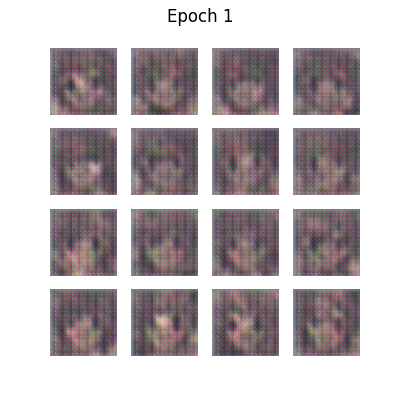

Epoch 1 | Gen loss: 1.3290 | Disc loss: 0.7692 | Time: 114.73s


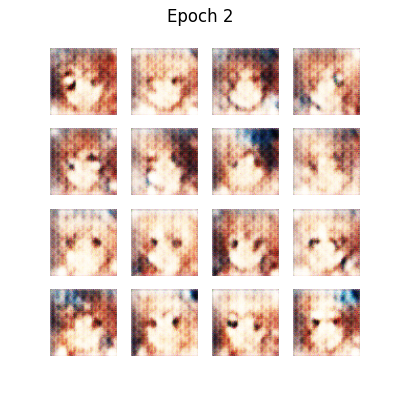

Epoch 2 | Gen loss: 1.1274 | Disc loss: 1.0315 | Time: 97.84s


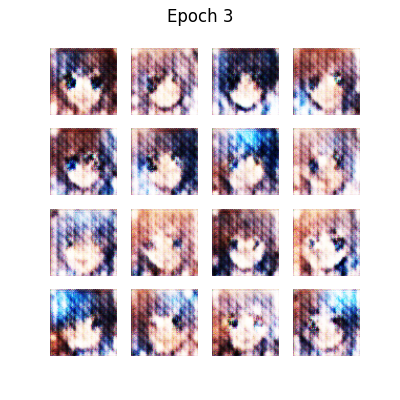

Epoch 3 | Gen loss: 0.9890 | Disc loss: 1.1146 | Time: 93.69s


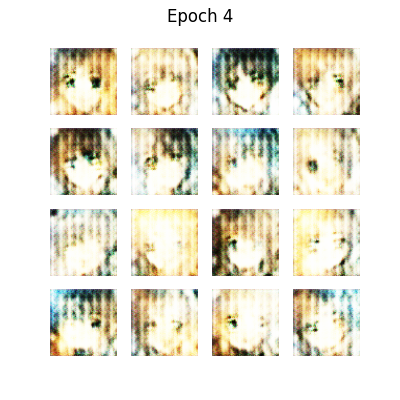

Epoch 4 | Gen loss: 1.0443 | Disc loss: 1.0483 | Time: 95.80s
[Epoch 5] Checkpoint saved: ./training_checkpoints/ckpt-1


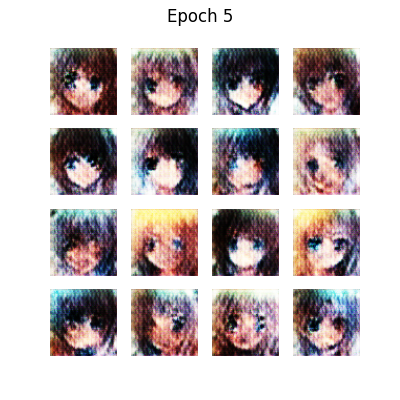

Epoch 5 | Gen loss: 1.0571 | Disc loss: 1.0258 | Time: 95.65s


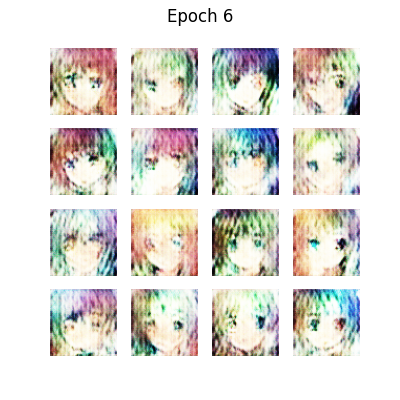

Epoch 6 | Gen loss: 1.0631 | Disc loss: 1.0435 | Time: 95.91s


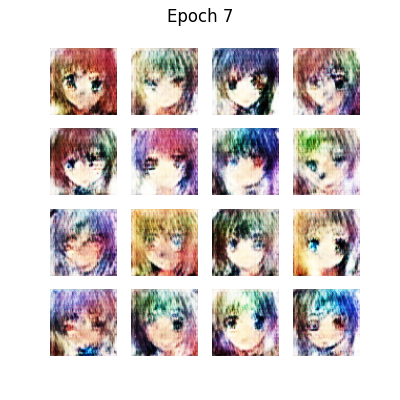

Epoch 7 | Gen loss: 1.0086 | Disc loss: 1.0601 | Time: 92.18s


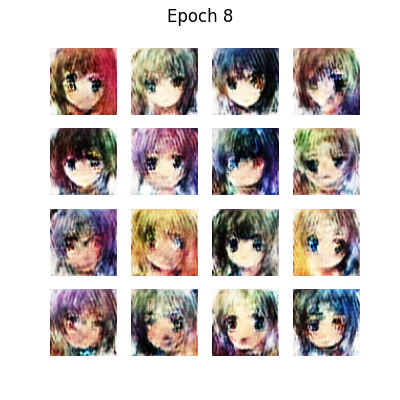

Epoch 8 | Gen loss: 0.9801 | Disc loss: 1.1126 | Time: 93.25s


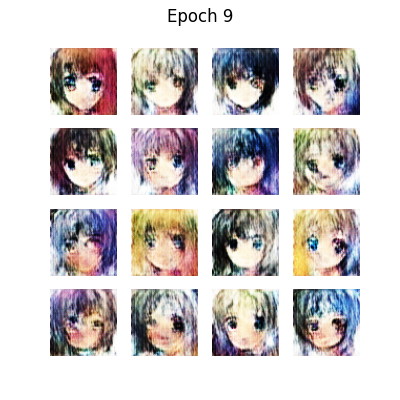

Epoch 9 | Gen loss: 0.9613 | Disc loss: 1.1229 | Time: 95.19s
[Epoch 10] Checkpoint saved: ./training_checkpoints/ckpt-2


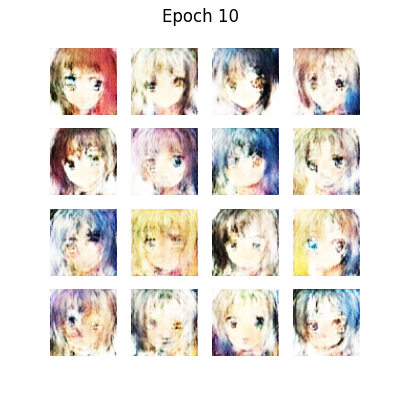

Epoch 10 | Gen loss: 0.9815 | Disc loss: 1.0990 | Time: 97.17s


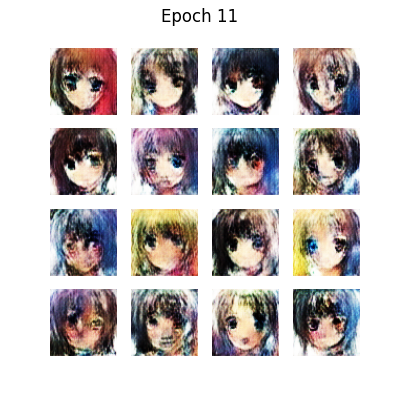

Epoch 11 | Gen loss: 1.0162 | Disc loss: 1.0700 | Time: 93.54s


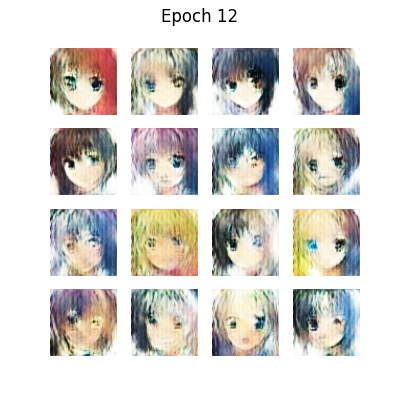

Epoch 12 | Gen loss: 1.2675 | Disc loss: 0.9613 | Time: 94.50s


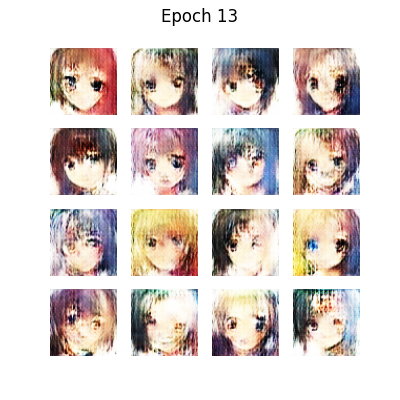

Epoch 13 | Gen loss: 1.1669 | Disc loss: 1.0383 | Time: 94.66s


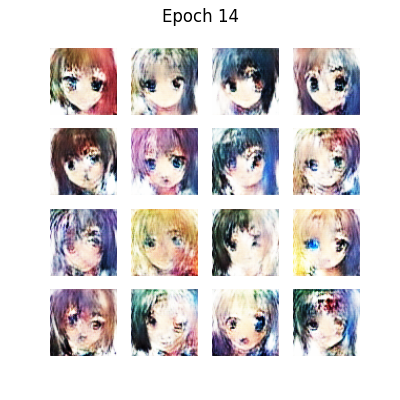

Epoch 14 | Gen loss: 1.1499 | Disc loss: 0.9373 | Time: 97.12s
[Epoch 15] Checkpoint saved: ./training_checkpoints/ckpt-3


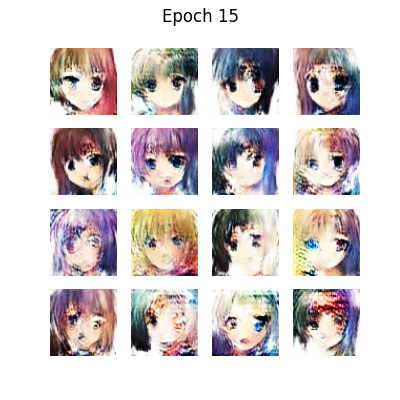

Epoch 15 | Gen loss: 1.2410 | Disc loss: 0.9445 | Time: 93.43s


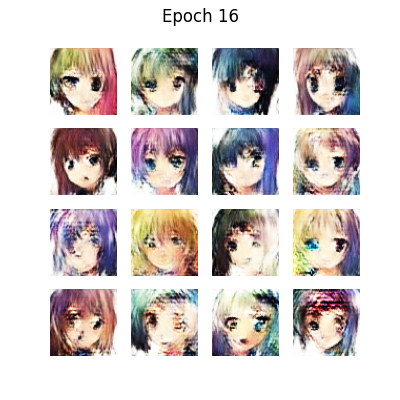

Epoch 16 | Gen loss: 1.2033 | Disc loss: 0.9747 | Time: 96.27s


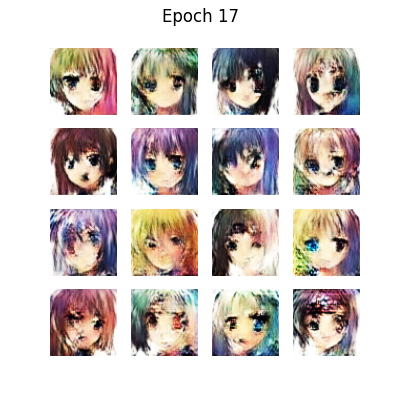

Epoch 17 | Gen loss: 1.1898 | Disc loss: 0.9786 | Time: 97.61s


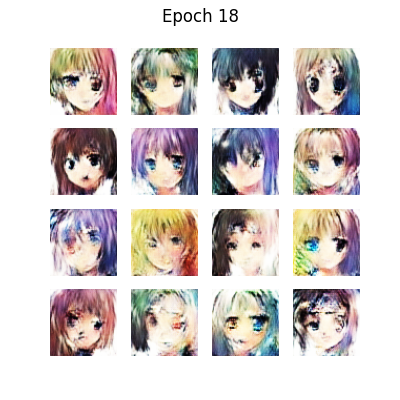

Epoch 18 | Gen loss: 1.2027 | Disc loss: 0.9626 | Time: 95.59s


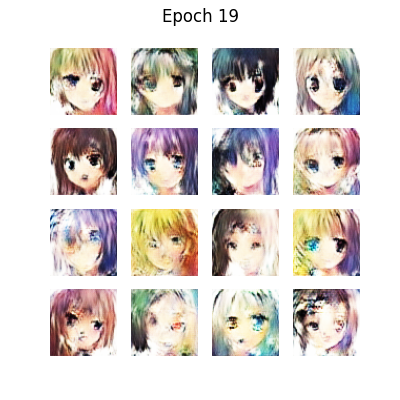

Epoch 19 | Gen loss: 1.2449 | Disc loss: 0.9160 | Time: 98.12s
[Epoch 20] Checkpoint saved: ./training_checkpoints/ckpt-4


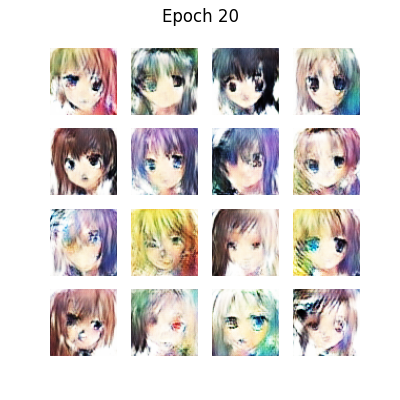

Epoch 20 | Gen loss: 1.3180 | Disc loss: 0.8668 | Time: 92.36s


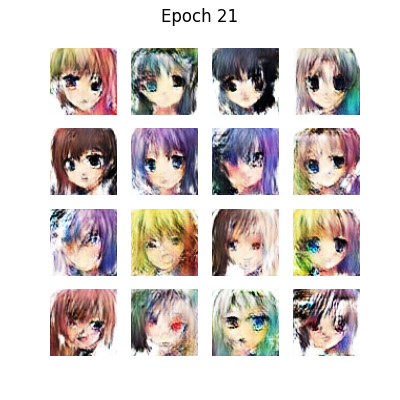

Epoch 21 | Gen loss: 1.3384 | Disc loss: 0.8807 | Time: 96.22s


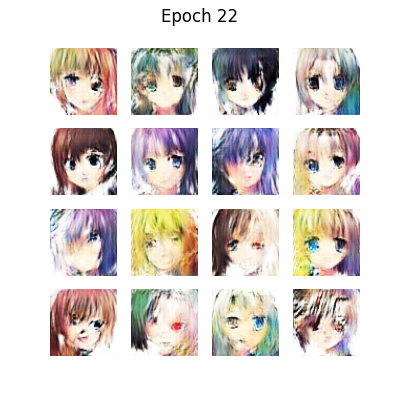

Epoch 22 | Gen loss: 1.3254 | Disc loss: 0.9149 | Time: 91.74s


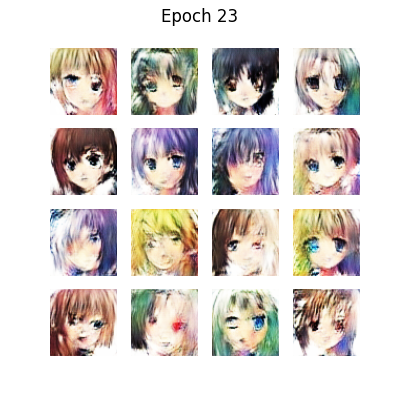

Epoch 23 | Gen loss: 1.3312 | Disc loss: 0.9031 | Time: 92.85s


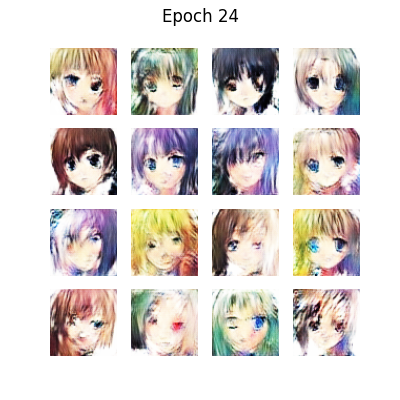

Epoch 24 | Gen loss: 1.3299 | Disc loss: 0.9348 | Time: 95.39s
[Epoch 25] Checkpoint saved: ./training_checkpoints/ckpt-5


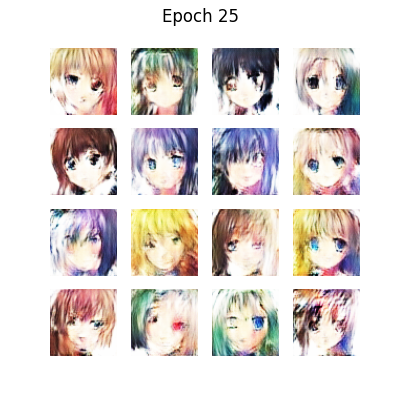

Epoch 25 | Gen loss: 1.3274 | Disc loss: 0.9499 | Time: 98.08s


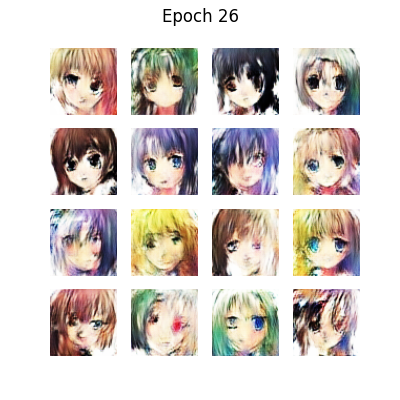

Epoch 26 | Gen loss: 1.3308 | Disc loss: 0.8870 | Time: 97.28s


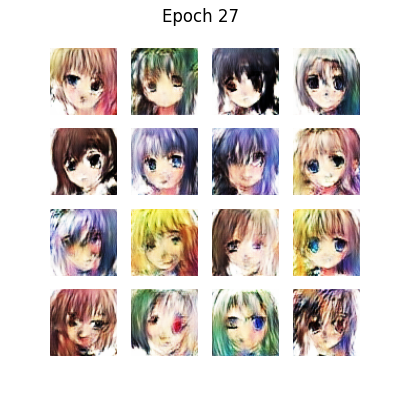

Epoch 27 | Gen loss: 1.3101 | Disc loss: 0.9466 | Time: 93.06s


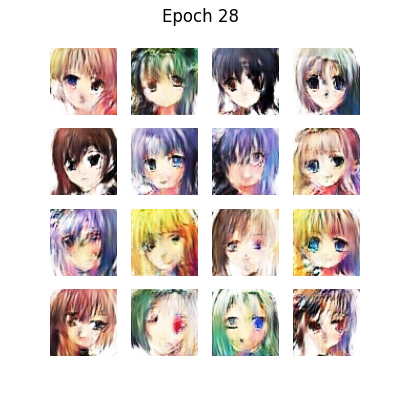

Epoch 28 | Gen loss: 1.3496 | Disc loss: 0.8752 | Time: 94.11s


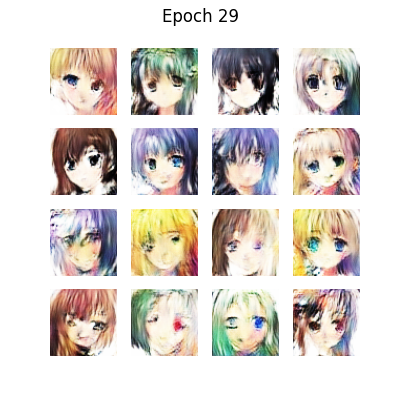

Epoch 29 | Gen loss: 1.3516 | Disc loss: 0.8964 | Time: 95.36s
[Epoch 30] Checkpoint saved: ./training_checkpoints/ckpt-6


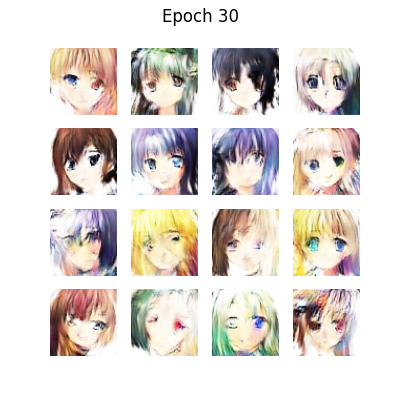

Epoch 30 | Gen loss: 1.3782 | Disc loss: 0.9182 | Time: 95.06s


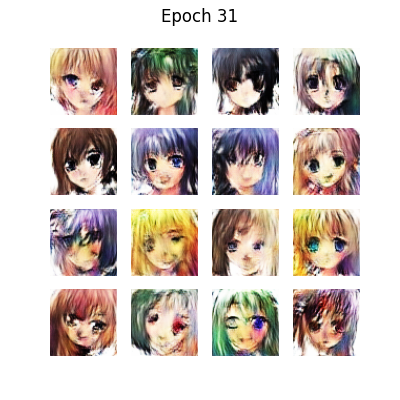

Epoch 31 | Gen loss: 1.3629 | Disc loss: 0.8991 | Time: 93.26s


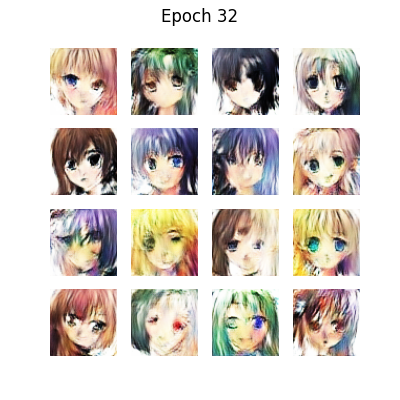

Epoch 32 | Gen loss: 1.3691 | Disc loss: 0.8759 | Time: 94.49s


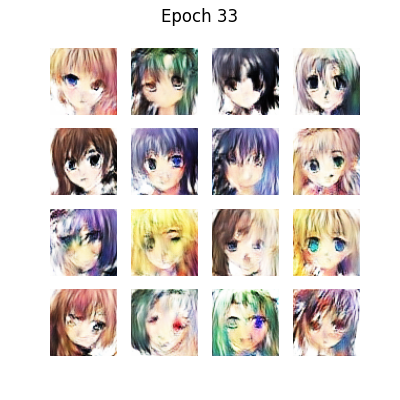

Epoch 33 | Gen loss: 1.3728 | Disc loss: 0.8826 | Time: 92.37s


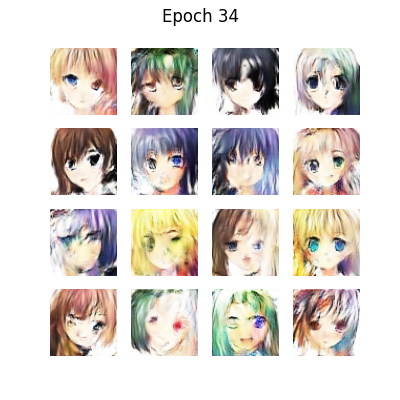

Epoch 34 | Gen loss: 1.4190 | Disc loss: 0.8492 | Time: 93.75s
[Epoch 35] Checkpoint saved: ./training_checkpoints/ckpt-7


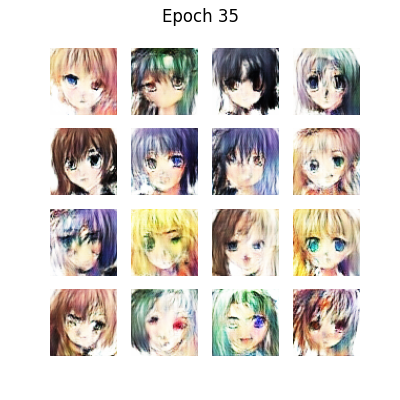

Epoch 35 | Gen loss: 1.4036 | Disc loss: 0.9154 | Time: 92.34s


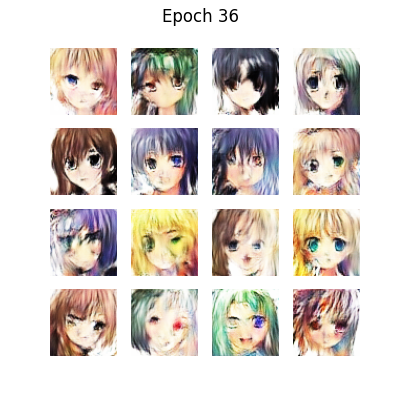

Epoch 36 | Gen loss: 1.4092 | Disc loss: 0.8424 | Time: 90.69s


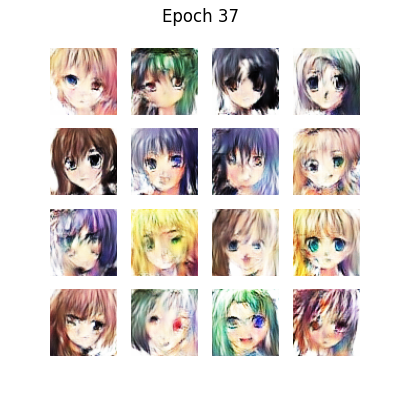

Epoch 37 | Gen loss: 1.4041 | Disc loss: 0.8695 | Time: 92.46s


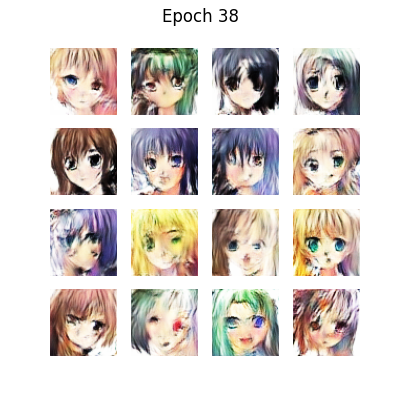

Epoch 38 | Gen loss: 1.3422 | Disc loss: 0.9516 | Time: 95.26s


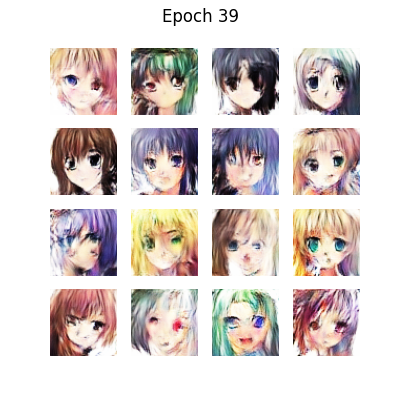

Epoch 39 | Gen loss: 1.3580 | Disc loss: 0.9291 | Time: 94.69s
[Epoch 40] Checkpoint saved: ./training_checkpoints/ckpt-8


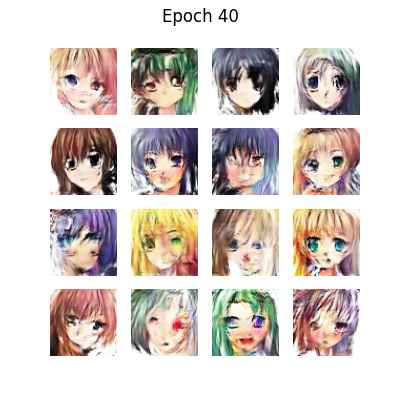

Epoch 40 | Gen loss: 1.3598 | Disc loss: 0.9034 | Time: 93.07s


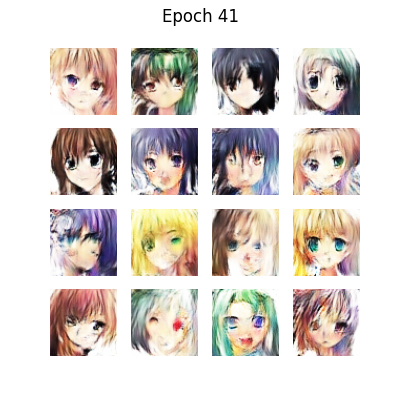

Epoch 41 | Gen loss: 1.4383 | Disc loss: 0.8600 | Time: 93.00s


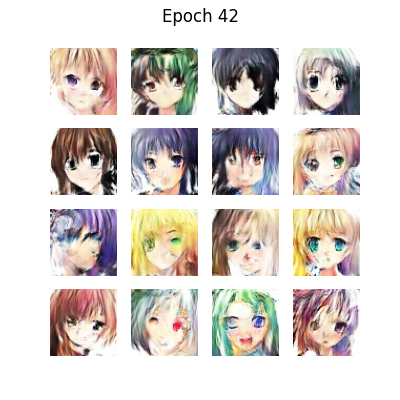

Epoch 42 | Gen loss: 1.3519 | Disc loss: 0.9183 | Time: 97.88s


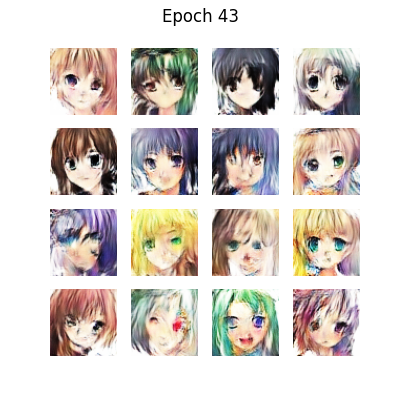

Epoch 43 | Gen loss: 1.4752 | Disc loss: 0.8048 | Time: 96.77s


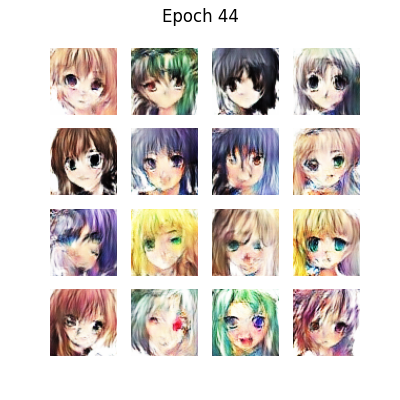

Epoch 44 | Gen loss: 1.4501 | Disc loss: 0.8396 | Time: 94.76s
[Epoch 45] Checkpoint saved: ./training_checkpoints/ckpt-9


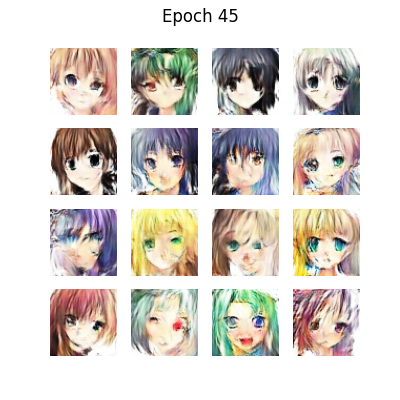

Epoch 45 | Gen loss: 1.4219 | Disc loss: 0.9007 | Time: 95.59s


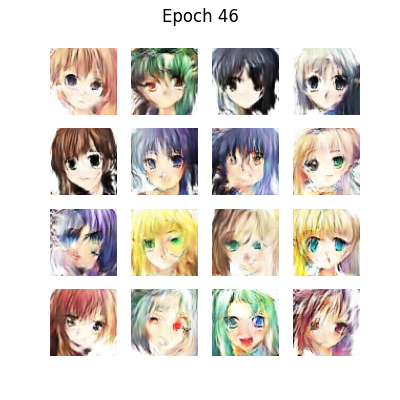

Epoch 46 | Gen loss: 1.4608 | Disc loss: 0.8320 | Time: 95.21s


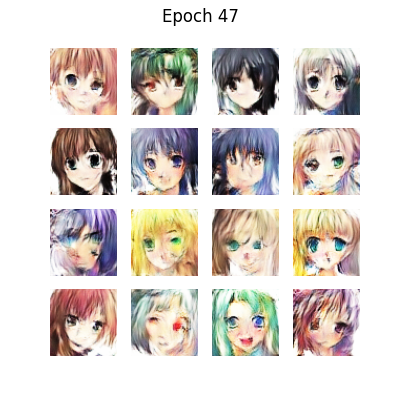

Epoch 47 | Gen loss: 1.4533 | Disc loss: 0.8577 | Time: 99.22s


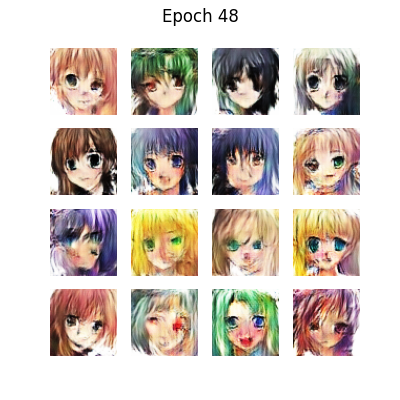

Epoch 48 | Gen loss: 1.4432 | Disc loss: 0.8775 | Time: 96.59s


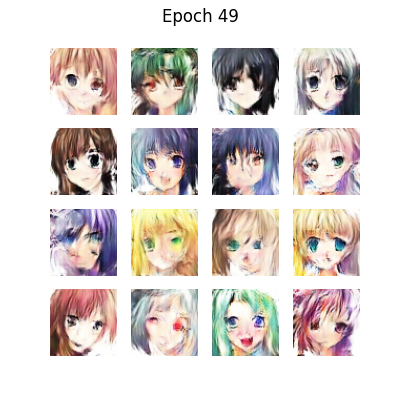

Epoch 49 | Gen loss: 1.5078 | Disc loss: 0.8140 | Time: 95.62s
[Epoch 50] Checkpoint saved: ./training_checkpoints/ckpt-10


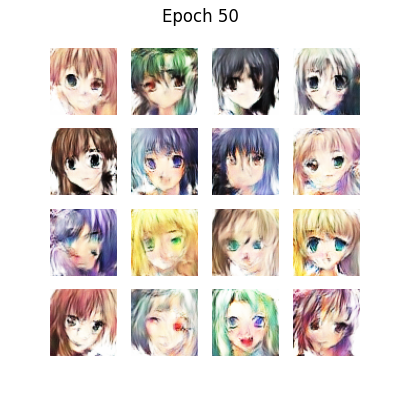

Epoch 50 | Gen loss: 1.4391 | Disc loss: 0.8698 | Time: 96.73s


In [16]:
EPOCHS = 50
train(train_dataset, EPOCHS)

## <span style="color: #c77dff">4 | </span><span style="color: #7b2cbf">Results</span>

### <span style="color: #e0aaff">4.1 | </span><span style="color: #9d4edd">Create an Animated GIF from Epoch Images</span>

/tmp/ipykernel_19/1697336854.py:7: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  writer.append_data(imageio.imread(fn))


Saved GIF → ./dcgan_progress.gif


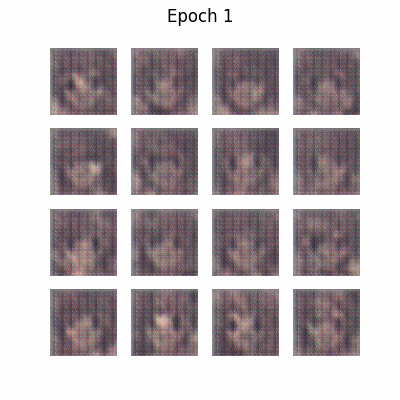

In [17]:
import imageio, glob

gif_path  = './dcgan_progress.gif'
files     = sorted(glob.glob(os.path.join(epoch_img_dir, 'image_at_epoch_*.png')))
with imageio.get_writer(gif_path, mode='I', duration=0.5) as writer:
    for fn in files:
        writer.append_data(imageio.imread(fn))
print(f"Saved GIF → {gif_path}")
display(Image(filename=gif_path))

## <span style="color: #c77dff">5 | </span><span style="color: #7b2cbf">Fresh Image Generation</span>

### <span style="color: #e0aaff">5.1 | </span><span style="color: #9d4edd">Generate 8 Completely New Images</span>

In [18]:
from tensorflow.keras.preprocessing.image import array_to_img

out_dir = './generated_samples'
os.makedirs(out_dir, exist_ok=True)

n = 8
noise = tf.random.normal([n, latent_dim])
imgs  = generator(noise, training=False)
imgs  = (imgs + 1) / 2.0

### <span style="color: #e0aaff">5.2 | </span><span style="color: #9d4edd">Plot and Save the generated images</span>

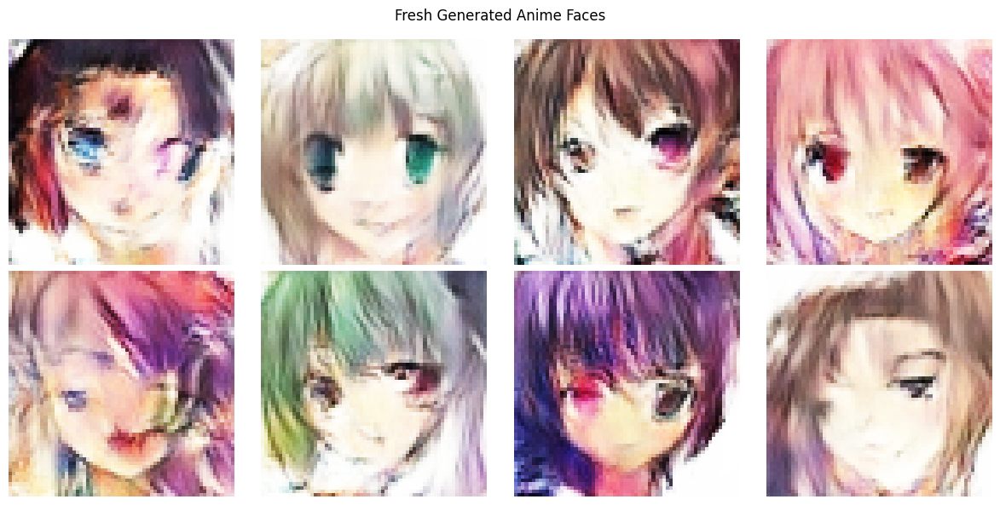

Saved 8 new images in './generated_samples/'


In [19]:
plt.figure(figsize=(12,6))
for i, img in enumerate(imgs):
    plt.subplot(2,4,i+1)
    plt.imshow(img); plt.axis('off')
    array_to_img(img).save(os.path.join(out_dir, f"sample_{i+1}.png"))
plt.suptitle("Fresh Generated Anime Faces"); plt.tight_layout(); plt.show()
print(f"Saved {n} new images in '{out_dir}/'")

## <span style="color: #c77dff">6 | </span><span style="color: #7b2cbf">Saving the Model</span>

In [20]:
generator.export('anime_dcgan_generator_savedmodel')
print("✅ Generator SavedModel exported to ./anime_dcgan_generator_savedmodel/")

Saved artifact at 'anime_dcgan_generator_savedmodel'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 100), dtype=tf.float32, name='keras_tensor')
Output Type:
  TensorSpec(shape=(None, 64, 64, 3), dtype=tf.float32, name=None)
Captures:
  137239714651536: TensorSpec(shape=(), dtype=tf.resource, name=None)
  137239714653264: TensorSpec(shape=(), dtype=tf.resource, name=None)
  137239714653648: TensorSpec(shape=(), dtype=tf.resource, name=None)
  137239714652496: TensorSpec(shape=(), dtype=tf.resource, name=None)
  137239714651920: TensorSpec(shape=(), dtype=tf.resource, name=None)
  137239714654800: TensorSpec(shape=(), dtype=tf.resource, name=None)
  137239714656144: TensorSpec(shape=(), dtype=tf.resource, name=None)
  137239714655184: TensorSpec(shape=(), dtype=tf.resource, name=None)
  137239714655376: TensorSpec(shape=(), dtype=tf.resource, name=None)
  137239714654992: TensorSpec(shape=(), dtype=tf.resource, name=None)


---

<p align="center">
    <strong style="font-size: 25px;">The End!</strong>
</p>

<br>

<p align="center">
    <span style="font-size: 16.5px; font-weight: normal;">Mohammad Soroush Esnaashari</span>
</p>

<p align="center">
  <a href="https://soroushesnaashari.github.io" target="_blank" style="display:inline-block; margin:0 4px;">
    <img alt="Website"
         src="https://img.shields.io/badge/-Website-2d2d2d?style=flat-square&logo=githubpages&logoColor=white"
         style="vertical-align:middle;">
  </a>
  <a href="https://www.linkedin.com/in/soroushesnaashari" target="_blank" style="display:inline-block; margin:0 4px;">
    <img alt="LinkedIn"
         src="https://custom-icon-badges.demolab.com/badge/-LinkedIn-2d2d2d?style=flat-square&logo=linkedin-white&logoColor=white"
         style="vertical-align:middle;">
  </a>
  <a href="https://x.com/srshesn" target="_blank" style="display:inline-block; margin:0 4px;">
    <img alt="X"
         src="https://img.shields.io/badge/-Twitter-2d2d2d?style=flat-square&logo=X&logoColor=white"
         style="vertical-align:middle;">
  </a>
  <a href="https://github.com/soroushesnaashari" target="_blank" style="display:inline-block; margin:0 4px;">
    <img alt="GitHub"
         src="https://img.shields.io/badge/-GitHub-2d2d2d?style=flat-square&logo=github&logoColor=white"
         style="vertical-align:middle;">
  </a>
  <a href="https://www.kaggle.com/soroushesnaashari" target="_blank" style="display:inline-block; margin:0 4px;">
    <img alt="Kaggle"
         src="https://img.shields.io/badge/-Kaggle-2d2d2d?style=flat-square&logo=kaggle&logoColor=white"
         style="vertical-align:middle;">
  </a>
</p>